# Generative Art with Perlin Noise 

Inspired by this article: [Introduction to generative art in Python using Perlin noise](https://www.gmschroeder.com/blog/intro_pyart1.html)

> **Perlin noise** is a type of **gradient noise** developed by Ken Perlin in 1983. It has many uses, including but not limited to: procedurally generating terrain, applying pseudo-random changes to a variable, and assisting in the creation of image textures.
> 
> Wikipedia: https://en.wikipedia.org/wiki/Perlin_noise

In [1]:
import noise
import numpy as np
import matplotlib.pyplot as plt

In [2]:
x = 0.001
y = 0.001
perlin_value = noise.pnoise2(x, y)

In [3]:
def generate_2d_perlin(n_x, n_y, scale=1, **kwargs):
    """Generate a 2D array of Perlin noise.

    Parameters:
        n_x (int): The number of columns in the generated noise array.
        n_y (int): The number of rows in the generated noise array.
        scale (float, optional): A scaling factor for the noise. Default is 1.
        **kwargs: Additional keyword arguments to pass to the ``noise.pnoise2`` function.

    Returns:
        numpy.ndarray: A 2D array of shape (n_y, n_x) containing Perlin noise values.
    """

    # Create an array for holding Perlin noise y coordinates correspond to the rows
    perlin_data = np.zeros((n_y, n_x))

    # Largest dimension - use to scale values
    max_n=max(n_y, n_x)

    # Compute noise using indices of the array
    for i in range(n_y):
        for j in range(n_x):
            perlin_data[i, j] = noise.pnoise2(
                j/max_n * scale, # pass x value first (j)
                i/max_n * scale,
                **kwargs # Additional keyword arguments to pass to pnoise2
            )

    return perlin_data

In [4]:
def plot_perlin_art(perlin_data, cmap="viridis", fig=None, ax=None, show_plot=True):
    """Plot 2D Perlin noise as a heatmap.

    Parameters:
        perlin_data (ndarray): A 2D array containing Perlin noise data.
        cmap (str, optional): The colormap to use for the heatmap. Default is "viridis".
        fig (matplotlib.figure.Figure, optional): A Matplotlib Figure object. If ``None``, a new figure is created.
        ax (matplotlib.axes.Axes, optional): A Matplotlib Axes object. If ``None``, a new axes is created.
        show_plot (bool, optional): If ``True``, the plot is displayed. Default is ``True``.

    Returns:
        tuple: A tuple containing the Matplotlib Figure and Axes objects.
    """

    if fig is None or ax is None:
        fig, ax = plt.subplots(1, 1)

    ax.imshow(perlin_data, cmap)
    ax.axis("off")
    ax.set_aspect("equal")

    if show_plot:
        plt.show()

    return fig, ax


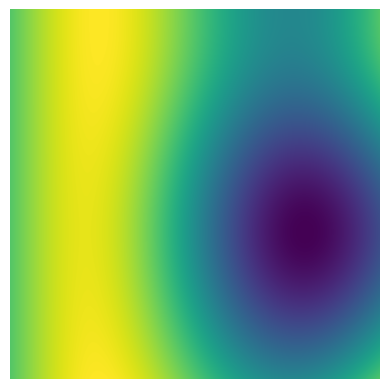

In [5]:
n_x = 1000
n_y = 1000

perlin_data = generate_2d_perlin(n_x, n_y)
fig, ax = plot_perlin_art(perlin_data)

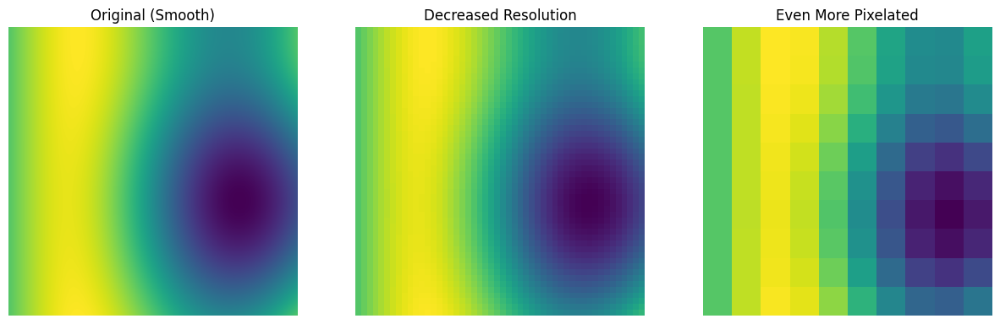

In [6]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

perlin_data = generate_2d_perlin(n_x=1000, n_y=1000)
fig, ax = plot_perlin_art(perlin_data, fig=fig, ax=axes[0], show_plot=False)
ax.set_title("Original (Smooth)")

perlin_data = generate_2d_perlin(n_x=50, n_y=50)
fig, ax = plot_perlin_art(perlin_data, fig=fig, ax=axes[1], show_plot=False)
ax.set_title("Decreased Resolution")

perlin_data = generate_2d_perlin(n_x=10, n_y=10)
fig, ax = plot_perlin_art(perlin_data, fig=fig, ax=axes[2], show_plot=False)
ax.set_title("Even More Pixelated")

plt.show()

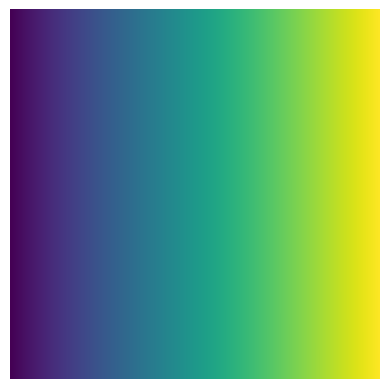

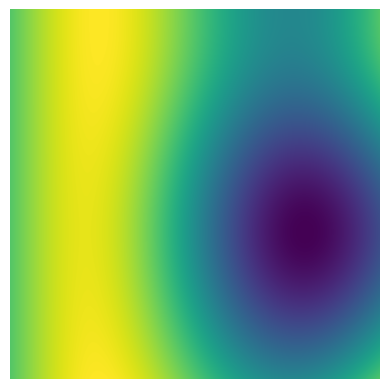

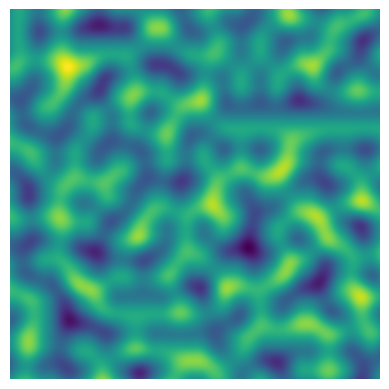

In [7]:
# Define dimensions of the data
n_x = 1000
n_y = 1000

# Larger pattern with scale < 1
perlin_data = generate_2d_perlin(n_x, n_y, scale=0.1)
fig, ax = plot_perlin_art(perlin_data)

# Default scale (1)
perlin_data = generate_2d_perlin(n_x, n_y, scale=1)
fig, ax = plot_perlin_art(perlin_data)

# Smaller patterns with scale > 1
perlin_data = generate_2d_perlin(n_x, n_y, scale=10)
fig, ax = plot_perlin_art(perlin_data)

## Adding Parameters

### Octaves

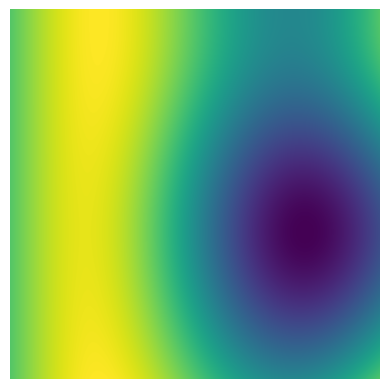

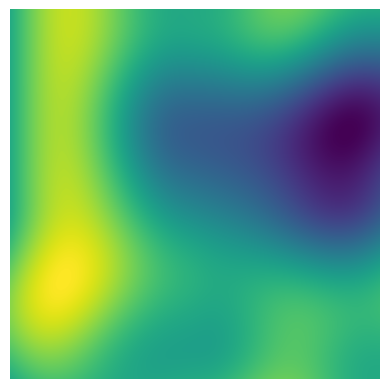

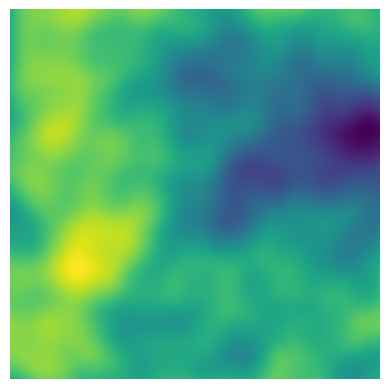

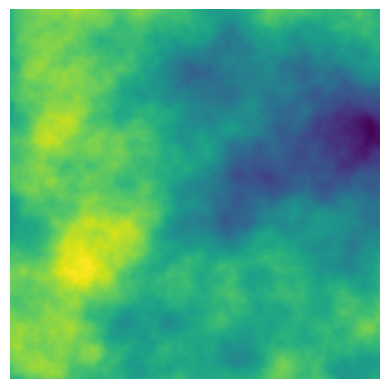

In [8]:
# Define dimensions of the data
n_x = 1000
n_y = 1000

# One octave (default)
perlin_data = generate_2d_perlin(n_x, n_y, octaves=1)
fig, ax = plot_perlin_art(perlin_data)

# Two octaves
perlin_data = generate_2d_perlin(n_x, n_y, octaves=2)
fig, ax = plot_perlin_art(perlin_data)

# Four octaves
perlin_data = generate_2d_perlin(n_x, n_y, octaves=4)
fig, ax = plot_perlin_art(perlin_data)

# Eight octaves
perlin_data = generate_2d_perlin(n_x, n_y, octaves=8)
fig, ax = plot_perlin_art(perlin_data)

### Lacunarity

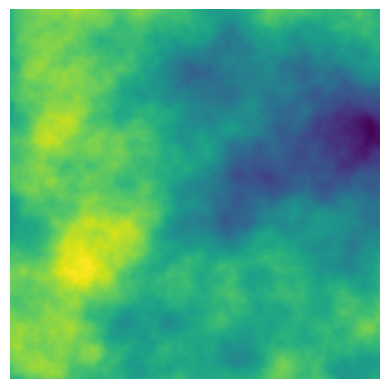

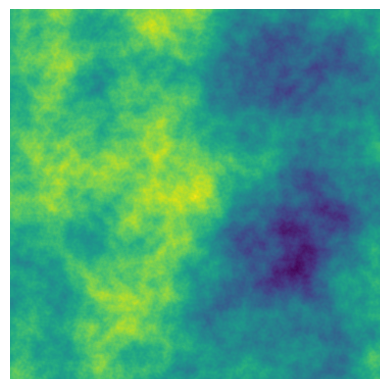

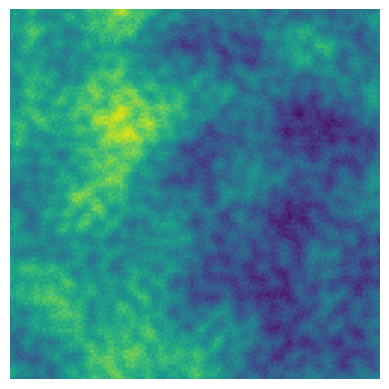

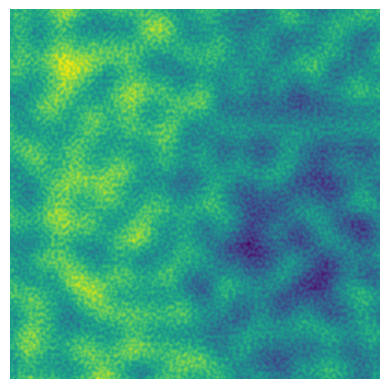

In [9]:
# Define dimensions of the data
n_x = 1000
n_y = 1000

# Number of octaves
octaves = 8

# lacunarity=2 (default)
perlin_data = generate_2d_perlin(n_x, n_y, octaves=octaves, lacunarity=2)
fig, ax = plot_perlin_art(perlin_data)

# lacunarity=3.25 (doesn't have to be an integer!)
perlin_data = generate_2d_perlin(n_x, n_y, octaves=octaves, lacunarity=3.25)
fig, ax = plot_perlin_art(perlin_data)

# lacunarity=5
perlin_data = generate_2d_perlin(n_x, n_y, octaves=octaves, lacunarity=5)
fig, ax = plot_perlin_art(perlin_data)

# lacunarity=10
perlin_data = generate_2d_perlin(n_x, n_y, octaves=octaves, lacunarity=10)
fig, ax = plot_perlin_art(perlin_data)

### Persistence

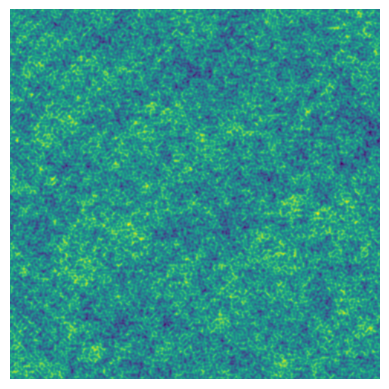

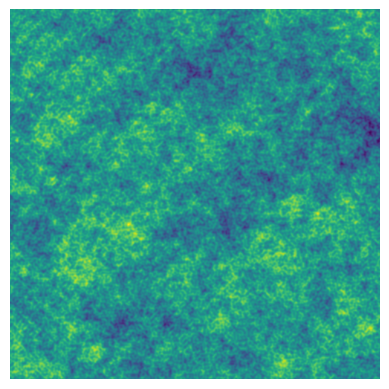

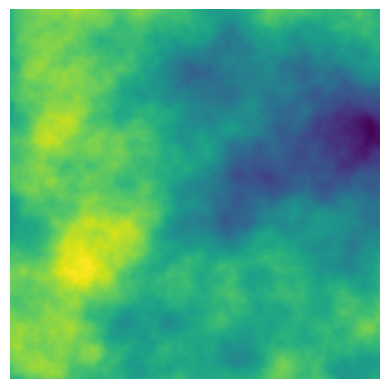

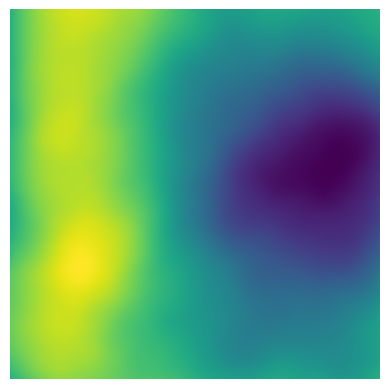

In [10]:
# Define dimensions of the data
n_x = 1000
n_y = 1000

# Number of octaves
octaves = 8

# persistence=1.25
perlin_data = generate_2d_perlin(n_x, n_y, octaves=octaves, persistence=1.25)
fig, ax = plot_perlin_art(perlin_data)

# persistence=1
perlin_data = generate_2d_perlin(n_x, n_y, octaves=octaves, persistence=1)
fig, ax = plot_perlin_art(perlin_data)

# persistence=0.5 (default)
perlin_data = generate_2d_perlin(n_x, n_y, octaves=octaves, persistence=0.5)
fig, ax = plot_perlin_art(perlin_data)

# persistence=0.25
perlin_data = generate_2d_perlin(n_x, n_y, octaves=octaves, persistence=0.25)
fig, ax = plot_perlin_art(perlin_data)

### Tiling

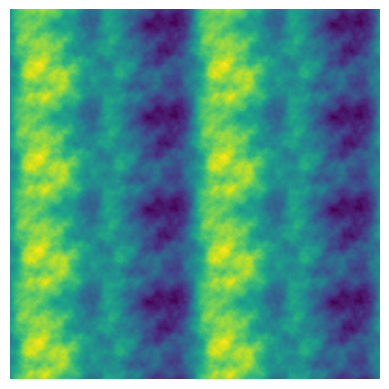

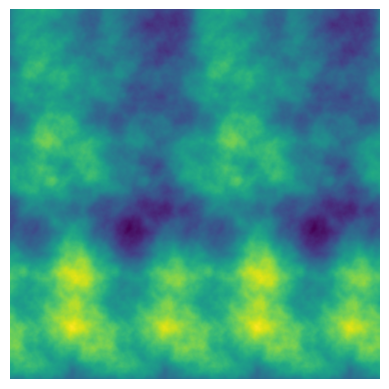

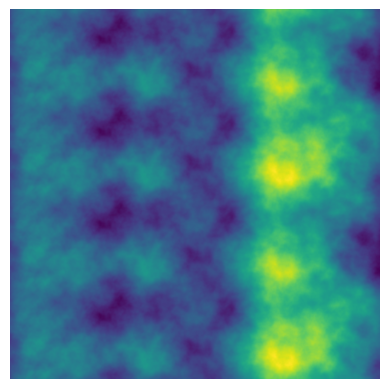

In [11]:
# Define dimensions of the data
n_x = 1000
n_y = 1000

# Parameters
scale = 2 # scale
octaves = 8 # number of octaves
n_tiles = 4 # number of tiles

# Tiling both x and y (tile size = scale/n_tiles)
perlin_data = generate_2d_perlin(
  n_x,
  n_y,
  scale=scale,
  octaves=octaves,
  repeatx=scale/n_tiles,
  repeaty=scale/n_tiles
)
fig, ax = plot_perlin_art(perlin_data)

# Tiling x only
perlin_data = generate_2d_perlin(
  n_x,
  n_y,
  scale=scale,
  octaves=octaves,
  repeatx=scale/n_tiles
)
fig, ax = plot_perlin_art(perlin_data)

# Tiling y only
perlin_data = generate_2d_perlin(
  n_x,
  n_y,
  scale=scale,
  octaves=octaves,
  repeaty=scale/n_tiles
)
fig, ax = plot_perlin_art(perlin_data)

## Experimenting with Colour

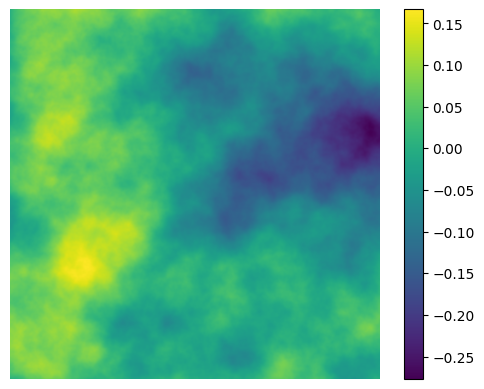

In [12]:
perlin_data = generate_2d_perlin(n_x = 1000, n_y = 1000, octaves=8)

# Plot the data as a heatmap with a colour bar
im = plt.imshow(perlin_data)
plt.colorbar(im)
plt.axis("off")
plt.show()

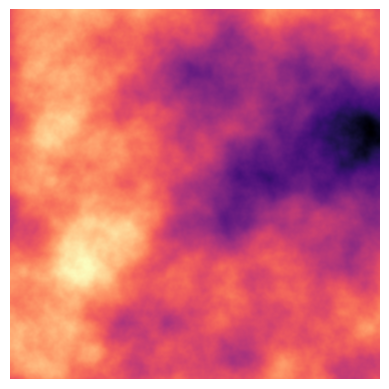

In [13]:
fig, ax = plot_perlin_art(perlin_data, cmap="magma")

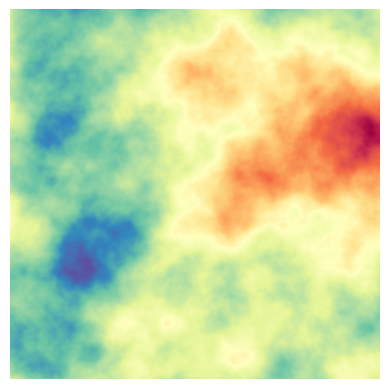

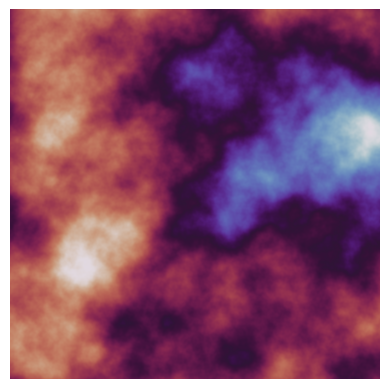

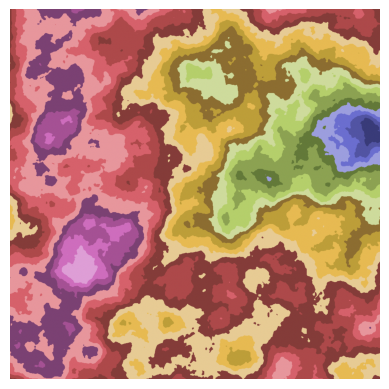

In [14]:
# Diverging - middle values are lightest,
# lowest and highest are darkest (but different colours)
fig, ax = plot_perlin_art(perlin_data, cmap="Spectral")

# Cyclic - colourmap loops around # (useful for cyclic data like time of day)
fig, ax = plot_perlin_art(perlin_data, cmap="twilight")

# Qualitative (discrete values)
fig, ax = plot_perlin_art(perlin_data, cmap="tab20b")

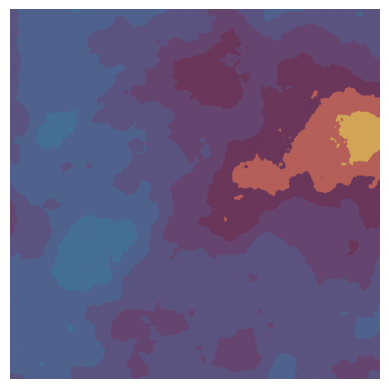

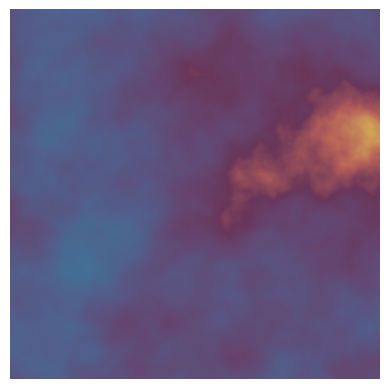

In [15]:
# Import classes for creating colourmaps
from matplotlib.colors import LinearSegmentedColormap, ListedColormap

# List of colours
clrs = ['#d2a556', '#b55f59','#6a365a','#65456f','#5b5380','#4f628d','#446f95']

# Qualitative colourmap (discrete values)
cmap_qualitative = ListedColormap(clrs)
fig, ax = plot_perlin_art(perlin_data, cmap=cmap_qualitative)

# Continuous colourmap (adds many additional interpolated colours)
cmap_continuous = LinearSegmentedColormap.from_list(name="my_cmap", colors=clrs)
fig, ax = plot_perlin_art(perlin_data, cmap=cmap_continuous)

## Scanning parameters

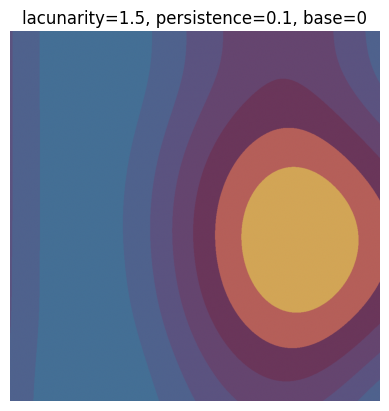

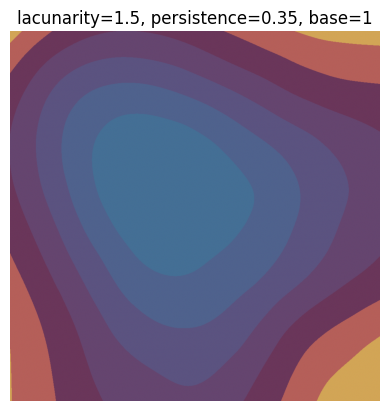

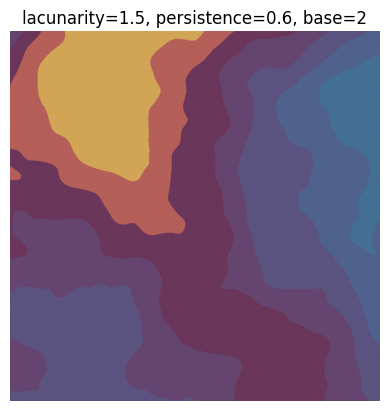

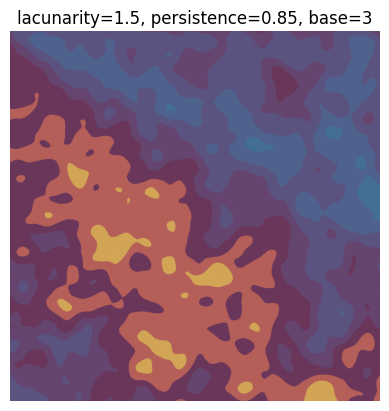

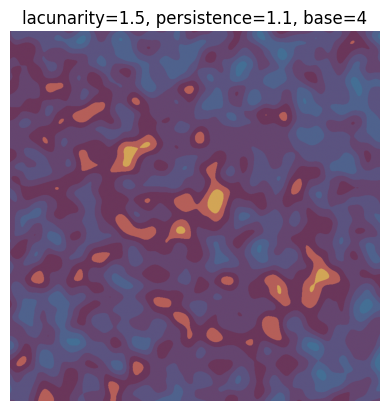

...

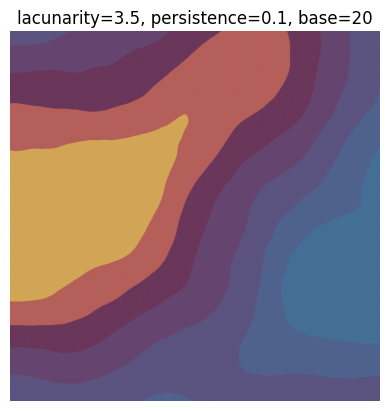

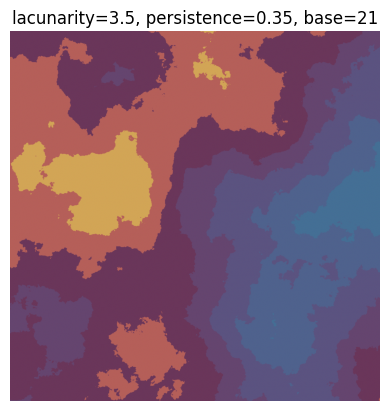

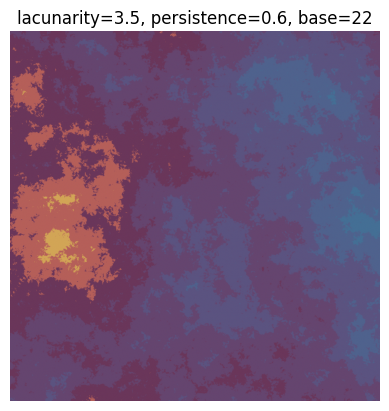

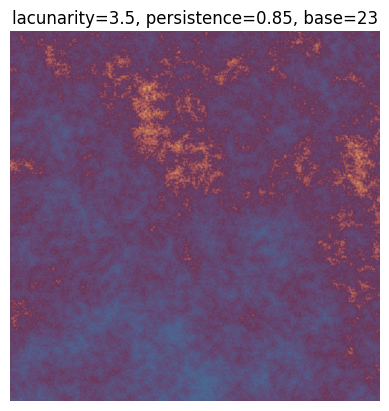

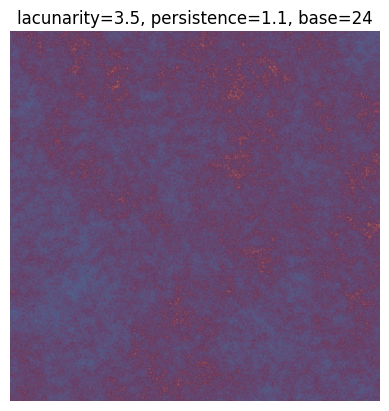

In [16]:
# Values to scan for lacunarity and persistence
# I've made the values evenly spaced here, but they do not have to be.
scan_lacunarity = np.linspace(1.5, 3.5, 5)
scan_persistence = np.linspace(0.1, 1.1, 5)

# Fixed parameters
n_x = 1000
n_y = 1000
octaves = 8

# Custom continuous colourmap
clrs = ['#d2a556', '#b55f59','#6a365a','#65456f','#5b5380','#4f628d','#446f95']
cmap = ListedColormap(clrs)

# Variable to use to set different base values
# (so the randomly generated data is markedly different for each output)
scan_count = 0

# Scan
for lacunarity in scan_lacunarity:
    for persistence in scan_persistence:
        # Generate data using specified parameters
        perlin_data = generate_2d_perlin(
            n_x=n_x,
            n_y=n_y,
            octaves=octaves,
            lacunarity=lacunarity,
            persistence=persistence,
            base=scan_count
        )

        # Plot with custom colourmap
        fig, ax = plot_perlin_art(perlin_data, cmap=cmap, show_plot=False)

        # Title with parameter values and base value
        ax.set_title(f"lacunarity={lacunarity}, persistence={persistence}, base={scan_count}")
        plt.show()

        # Increment to change base for each iteration
        scan_count += 1

In [17]:
def generate_perlin_art_param(
        seed=0, lacunarity_min=1.5, lacunarity_max=3.5, persistence_min=0.1, persistence_max=1.1,
        base_min=1, base_max=99, octaves=8, n_x=1000, n_y=1000):
    """
    Generate parameters for Perlin noise-based generative art.

    Parameters:
        seed (int): Seed for the random number generator. Default is 0.
        lacunarity_min (float): Lower limit for lacunarity. Default is 1.5.
        lacunarity_max (float): Upper limit for lacunarity. Default is 3.5.
        persistence_min (float): Lower limit for persistence. Default is 0.1.
        persistence_max (float): Upper limit for persistence. Default is 1.1.
        base_min (int): Lower limit for base value. Default is 1.
        base_max (int): Upper limit for base value. Default is 99.
        octaves (int): Number of octaves for noise generation. Default is 8.
        n_x (int): Width of the generated art. Default is 1000.
        n_y (int): Height of the generated art. Default is 1000.

    Returns:
        dict: A dictionary containing the generated parameters for Perlin noise.
    """

    # Dictionary for storing parameters
    param = {}

    # Set seed
    np.random.seed(seed)

    # Select lacunarity and persistence from uniform distributions with specified bounds
    # Round to two decimal places so easier to print and since small changes do not greatly
    # impact the results for these parameters
    # (rounding may not be appropriate for other parameters)
    param["lacunarity"] = round(np.random.uniform(low=lacunarity_min, high=lacunarity_max),2)
    param["persistence"] = round(np.random.uniform(low=persistence_min, high=persistence_max),2)

    # Randomly generate an integer for the base value
    param["base"] = np.random.randint(low=base_min, high=base_max)

    # Add fixed parameters to dictionary
    param["octaves"] = octaves
    param["n_x"] = n_x
    param["n_y"] = n_y

    return param

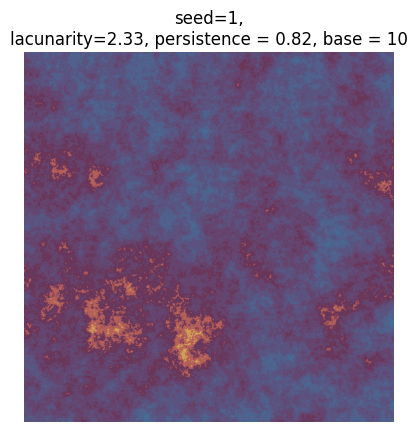

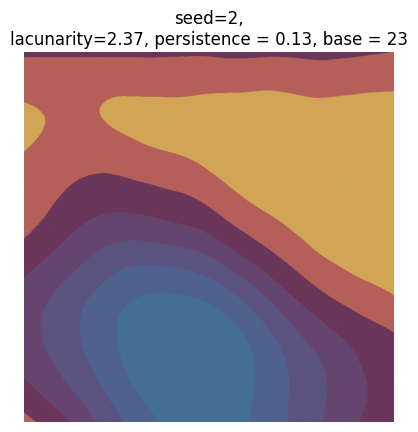

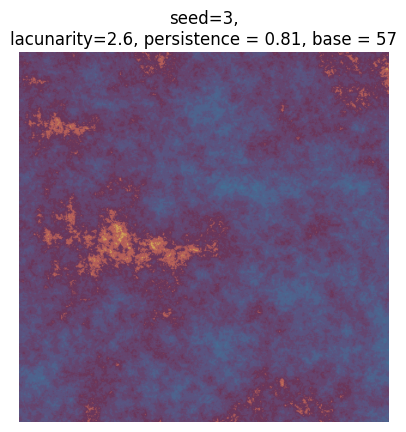

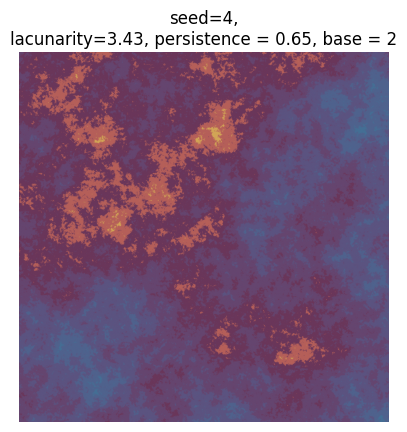

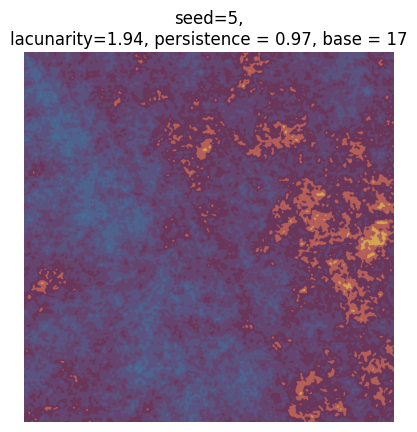

...

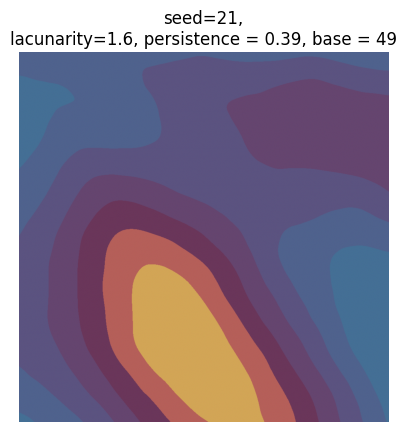

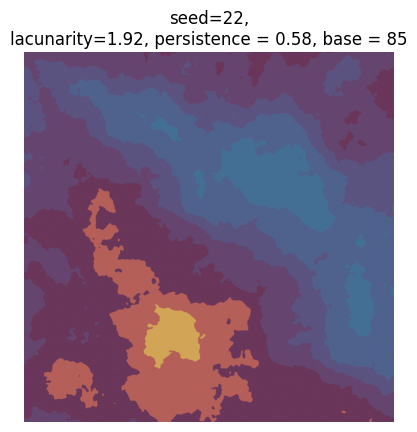

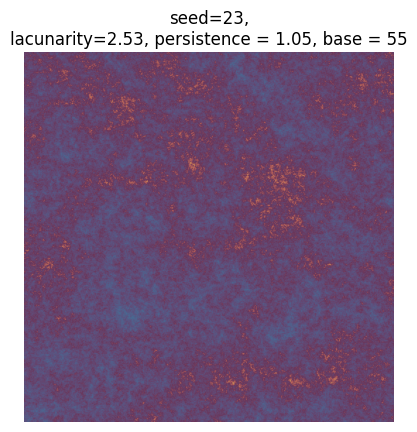

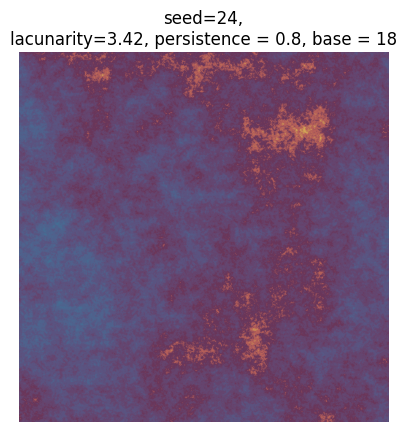

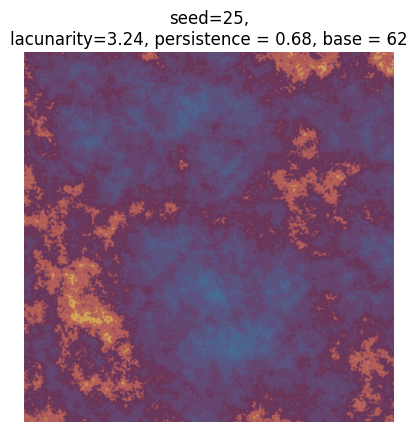

In [18]:
# Number of plots to produce
n_outputs = 25

# Variable for shifting seed values
starting_seed = 1

for i in range(n_outputs):
    seed_i = i + starting_seed
    param = generate_perlin_art_param(seed=seed_i)

    perlin_data = generate_2d_perlin(**param)

    fig, ax = plot_perlin_art(perlin_data, cmap=cmap, show_plot=False)
    ax.set_title(
        f"seed={seed_i},\n"
        f"lacunarity={param['lacunarity']}, "
        f"persistence = {param['persistence']}, "
        f"base = {param['base']}"
    )
    plt.show()